# Start: Datenvorverarbeitung

In [3]:
import pandas as pd
import numpy as np
import missingno as msno
# from ydata_profiling import ProfileReport
import plotly_express as px

In [2]:
# pd.options.display.max_rows = 60
pd.options.display.max_columns = None

# Datasets

In [4]:
zip_path1 = "../public/aisles.csv.zip"
zip_path2 = "../public/departments.csv.zip"
zip_path3 = "../public/order_products_s.csv.zip"
zip_path4 = "../public/orders_s.csv.zip"
zip_path5 = "../public/products.csv.zip"
zip_path6 = "../public/tips.csv.zip"

In [5]:
df_aisles = pd.read_csv(zip_path1, compression="zip")
df_departments = pd.read_csv(zip_path2, compression="zip")
df_order_products = pd.read_csv(zip_path3, compression="zip")
df_oders_s = pd.read_csv(zip_path4, compression="zip")
df_products = pd.read_csv(zip_path5, compression="zip")
df_tips = pd.read_csv("../public/tips.csv")

## Zusammengeführte Tabellen

In [6]:
product_details_df = pd.read_csv("../product_details.csv")
order_product_details_df = pd.read_csv("../order_product_details.csv")
order_product_df = pd.read_csv("../full_order_product.csv")
full_df = pd.read_csv("../full_data.csv")

## ER-Modell

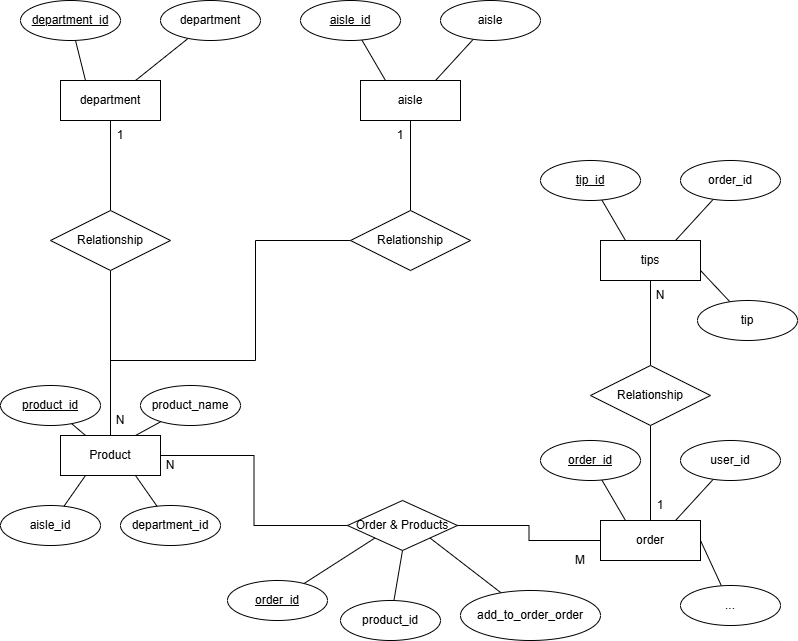

In [7]:
from IPython.display import Image

# Path to your HTML file
png_path = "../dabi1_overview.png"

# Bild anzeigen
Image(filename=png_path)

# Methoden zu fundamentalen Datenanalyse

In [10]:
# Überblick über die Daten
def data_overview(df):
    """Gibt die ersten Zeilen, Infos und statistische Kennzahlen des DataFrames aus."""
    print("\nInformationen über den DataFrame:")
    print(df.info())
    print("\nStatistische Kennzahlen:")
    display(df.describe())

In [11]:
# Spalteninformationen
def column_info(df):
    """Gibt Spaltennamen, Datentypen und eindeutige Werte pro Spalte aus."""
    print("Spaltennamen:")
    print(df.columns)
    print("\nDatentypen:")
    print(df.dtypes)
    for col in df.columns:
        print(f"\nEindeutige Werte in '{col}': {df[col].nunique()}")
        print(df[col].unique())

In [12]:
# Fehlende Werte analysieren
def missing_values(df):
    """Zeigt die Anzahl der fehlenden Werte pro Spalte."""
    print("Fehlende Werte pro Spalte:")
    print(df.isnull().sum())
    msno.matrix(df)

In [13]:
# Daten bereinigen
def clean_data(df, columns=None):
    """
    Entfernt fehlende Werte und doppelte Zeilen im DataFrame. Wenn eine Liste von Spalten
    angegeben wird, werden nur in diesen Spalten fehlende Werte entfernt.
    
    Parameter:
    - df (DataFrame): Der zu bereinigende DataFrame.
    - columns (list, optional): Liste der Spalten, in denen fehlende Werte entfernt werden sollen.
                                 Wenn None, werden fehlende Werte in allen Spalten entfernt.
                                 
    Returns:
    - DataFrame: Der bereinigte DataFrame.
    """
    if columns:
        # Fehlende Werte nur in den angegebenen Spalten entfernen
        df_cleaned = df.dropna(subset=columns)
    else:
        # Fehlende Werte in allen Spalten entfernen
        df_cleaned = df.dropna()
    
    # Duplikate entfernen
    df_cleaned = df_cleaned.drop_duplicates()
    
    print(f"Daten bereinigt (fehlende Werte {'in den angegebenen Spalten' if columns else 'in allen Spalten'} und Duplikate entfernt).")
    return df_cleaned

In [14]:
# Daten filtern
def filter_data(df, column, value):
    """Filtert den DataFrame basierend auf einem bestimmten Wert in einer Spalte."""
    df_filtered = df[df[column] == value]
    print(f"Gefilterte Daten für {column} == {value}:")
    print(df_filtered)
    return df_filtered


In [15]:
# Gruppieren und aggregieren TODO noch mal aktuallisieren, falls Aggregate zu veraltet
def group_and_aggregate(df, group_column, agg_column, agg_func='mean'):
    """Gruppiert den DataFrame nach einer Spalte und aggregiert eine andere Spalte."""
    grouped_data = df.groupby(group_column)[agg_column].agg(agg_func)
    print(f"\nGruppierte Daten nach '{group_column}', aggregiert mit '{agg_func}' auf '{agg_column}':")
    print(grouped_data)
    return grouped_data

In [16]:
# Pivot-Tabelle erstellen
def create_pivot_table(df, index, columns, values, aggfunc='sum'):
    """Erstellt eine Pivot-Tabelle mit den angegebenen Parametern."""
    pivot = df.pivot_table(index=index, columns=columns, values=values, aggfunc=aggfunc)
    print(f"\nPivot-Tabelle (Index: {index}, Spalten: {columns}, Werte: {values}):")
    print(pivot)
    return pivot

# Test Vorverarbeitung (Probe-Phase)

## Aisles (Gänge im Laden)

In [23]:
df_aisles

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation
...,...,...
129,130,hot cereal pancake mixes
130,131,dry pasta
131,132,beauty
132,133,muscles joints pain relief


In [24]:
data_overview(df_aisles)


Informationen über den DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   aisle_id  134 non-null    int64 
 1   aisle     134 non-null    object
dtypes: int64(1), object(1)
memory usage: 2.2+ KB
None

Statistische Kennzahlen:


,aisle_id
count,134.000000
mean,67.500000
std,38.826537
min,1.000000
25%,34.250000
50%,67.500000
75%,100.750000
max,134.000000


In [25]:
column_info(df_aisles)

Spaltennamen:
Index(['aisle_id', 'aisle'], dtype='object')

Datentypen:
aisle_id     int64
aisle       object
dtype: object

Eindeutige Werte in 'aisle_id': 134
[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126
 127 128 129 130 131 132 133 134]

Eindeutige Werte in 'aisle': 134
['prepared soups salads' 'specialty cheeses' 'energy granola bars'
 'instant foods' 'marinades meat preparation' 'other' 'packaged meat'
 'bakery desserts' 'pasta sauce' 'kitchen supplies' 'cold flu allergy'
 'fresh pasta' 'prepared meals' 'tofu meat alternati

Fehlende Werte pro Spalte:
aisle_id    0
aisle       0
dtype: int64


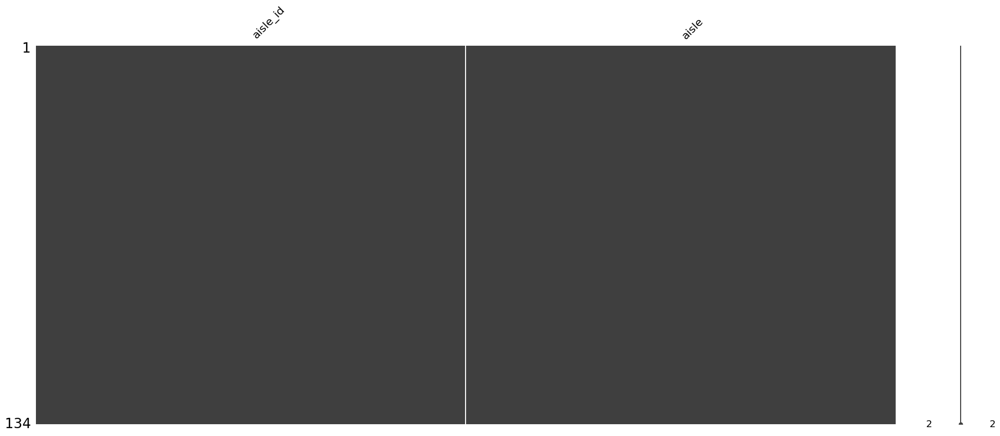

In [26]:
missing_values(df_aisles)

## departments

In [27]:
df_departments

,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol
5,6,international
6,7,beverages
7,8,pets
8,9,dry goods pasta
9,10,bulk


In [28]:
data_overview(df_departments)


Informationen über den DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   department_id  21 non-null     int64 
 1   department     21 non-null     object
dtypes: int64(1), object(1)
memory usage: 468.0+ bytes
None

Statistische Kennzahlen:


,department_id
count,21.000000
mean,11.000000
std,6.204837
min,1.000000
25%,6.000000
50%,11.000000
75%,16.000000
max,21.000000


In [29]:
column_info(df_departments)

Spaltennamen:
Index(['department_id', 'department'], dtype='object')

Datentypen:
department_id     int64
department       object
dtype: object

Eindeutige Werte in 'department_id': 21
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]

Eindeutige Werte in 'department': 21
['frozen' 'other' 'bakery' 'produce' 'alcohol' 'international' 'beverages'
 'pets' 'dry goods pasta' 'bulk' 'personal care' 'meat seafood' 'pantry'
 'breakfast' 'canned goods' 'dairy eggs' 'household' 'babies' 'snacks'
 'deli' 'missing']


Fehlende Werte pro Spalte:
department_id    0
department       0
dtype: int64


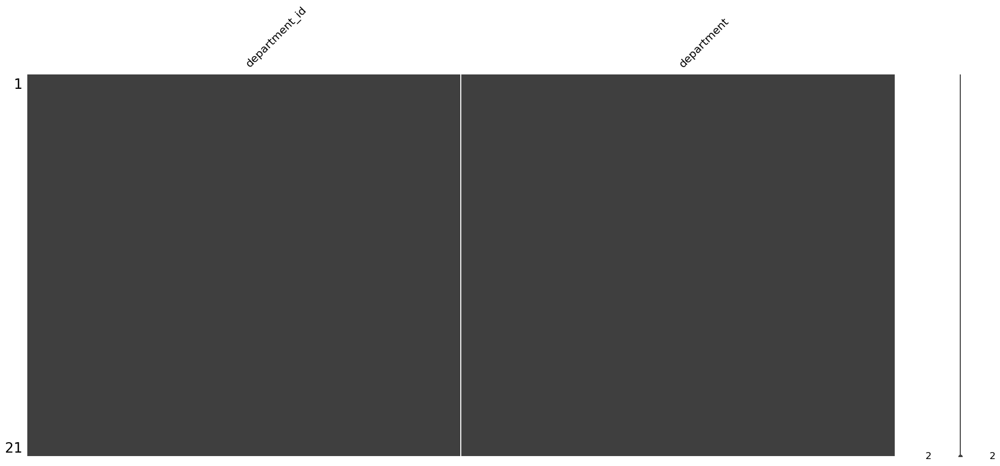

In [30]:
missing_values(df_departments)

## Order and Products

In [31]:
df_order_products

,order_id,product_id,add_to_cart_order
0,2,33120,1
1,2,28985,2
2,2,9327,3
3,2,45918,4
4,2,30035,5
...,...,...,...
16942231,3421058,6244,4
16942232,3421058,6858,5
16942233,3421058,30316,6
16942234,3421058,35578,7


In [32]:
data_overview(df_order_products)


Informationen über den DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16942236 entries, 0 to 16942235
Data columns (total 3 columns):
 #   Column             Dtype
---  ------             -----
 0   order_id           int64
 1   product_id         int64
 2   add_to_cart_order  int64
dtypes: int64(3)
memory usage: 387.8 MB
None

Statistische Kennzahlen:


,order_id,product_id,add_to_cart_order
count,1.694224e+07,1.694224e+07,1.694224e+07
mean,1.710931e+06,2.557724e+04,8.396048e+00
std,9.877055e+05,1.410086e+04,7.171578e+00
min,1.000000e+00,1.000000e+00,1.000000e+00
25%,8.547840e+05,1.352100e+04,3.000000e+00
50%,1.711184e+06,2.525600e+04,6.000000e+00
75%,2.565863e+06,3.794700e+04,1.200000e+01
max,3.421081e+06,4.968800e+04,1.210000e+02


In [33]:
column_info(df_order_products)

Spaltennamen:
Index(['order_id', 'product_id', 'add_to_cart_order'], dtype='object')

Datentypen:
order_id             int64
product_id           int64
add_to_cart_order    int64
dtype: object

Eindeutige Werte in 'order_id': 1673021
[      2       4       5 ... 3421026 3421049 3421058]

Eindeutige Werte in 'product_id': 49258
[33120 28985  9327 ... 36233 20872 19267]

Eindeutige Werte in 'add_to_cart_order': 121
[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108
 109 110 111 112 113 114 115 116 117 118 119 120 121]


Fehlende Werte pro Spalte:
order_id             0
product_id           0
add_to_cart_order    0
dtype: int64


c:\Users\achim\anaconda3\envs\dsc4\Lib\site-packages\matplotlib\image.py:181: UserWarning: Data with more than 2**24 rows cannot be accurately displayed. Downsampling to less than 2**24 rows before displaying. To remove this warning, manually downsample your data.
  warnings.warn(msg.format(n='2**24 rows'))


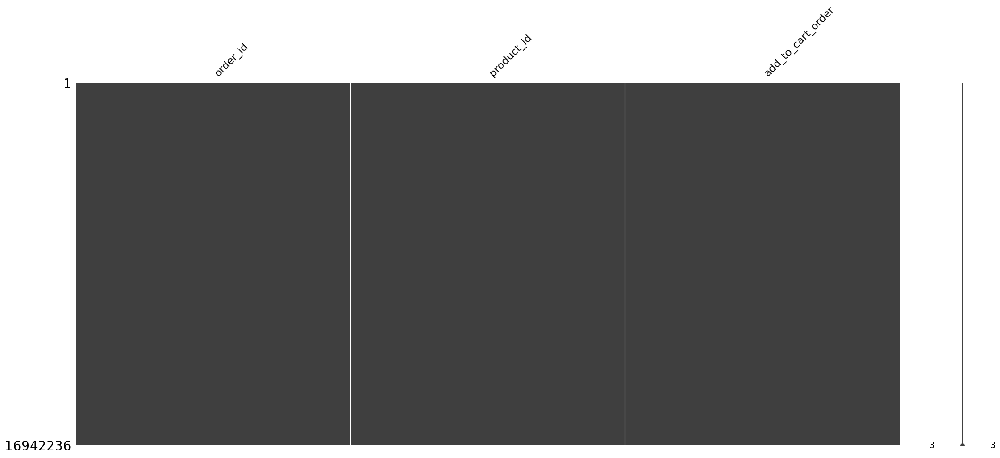

In [34]:
missing_values(df_order_products)

## Order details

In [35]:
df_oders_s

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,1,2,8,NaN
1,2398795,1,2,3,7,15.0
2,473747,1,3,3,12,21.0
3,2254736,1,4,4,7,29.0
4,431534,1,5,4,15,28.0
...,...,...,...,...,...,...
1673016,2266710,206209,10,5,18,29.0
1673017,1854736,206209,11,4,10,30.0
1673018,626363,206209,12,1,12,18.0
1673019,2977660,206209,13,1,12,7.0


In [36]:
data_overview(df_oders_s)


Informationen über den DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1673021 entries, 0 to 1673020
Data columns (total 6 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   order_id                1673021 non-null  int64  
 1   user_id                 1673021 non-null  int64  
 2   order_number            1673021 non-null  int64  
 3   order_dow               1673021 non-null  int64  
 4   order_hour_of_day       1673021 non-null  int64  
 5   days_since_prior_order  1569917 non-null  float64
dtypes: float64(1), int64(5)
memory usage: 76.6 MB
None

Statistische Kennzahlen:


,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
count,1.673021e+06,1.673021e+06,1.673021e+06,1.673021e+06,1.673021e+06,1.569917e+06
mean,1.711566e+06,1.026010e+05,1.715911e+01,2.778702e+00,1.343874e+01,1.096469e+01
std,9.879966e+05,5.953765e+04,1.774634e+01,2.046396e+00,4.230250e+00,9.116281e+00
min,1.000000e+00,1.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,8.551020e+05,5.085900e+04,5.000000e+00,1.000000e+00,1.000000e+01,4.000000e+00
50%,1.711953e+06,1.019550e+05,1.100000e+01,3.000000e+00,1.300000e+01,7.000000e+00
75%,2.567202e+06,1.538930e+05,2.300000e+01,5.000000e+00,1.600000e+01,1.500000e+01
max,3.421081e+06,2.062090e+05,1.000000e+02,6.000000e+00,2.300000e+01,3.000000e+01


In [37]:
column_info(df_oders_s)

Spaltennamen:
Index(['order_id', 'user_id', 'order_number', 'order_dow', 'order_hour_of_day',
       'days_since_prior_order'],
      dtype='object')

Datentypen:
order_id                    int64
user_id                     int64
order_number                int64
order_dow                   int64
order_hour_of_day           int64
days_since_prior_order    float64
dtype: object

Eindeutige Werte in 'order_id': 1673021
[2539329 2398795  473747 ...  626363 2977660  272231]

Eindeutige Werte in 'user_id': 103104
[     1      3      5 ... 206207 206208 206209]

Eindeutige Werte in 'order_number': 100
[  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18
  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35  36
  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54
  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72
  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90
  91  92  93  94  95  96  97  9

Fehlende Werte pro Spalte:
order_id                       0
user_id                        0
order_number                   0
order_dow                      0
order_hour_of_day              0
days_since_prior_order    103104
dtype: int64


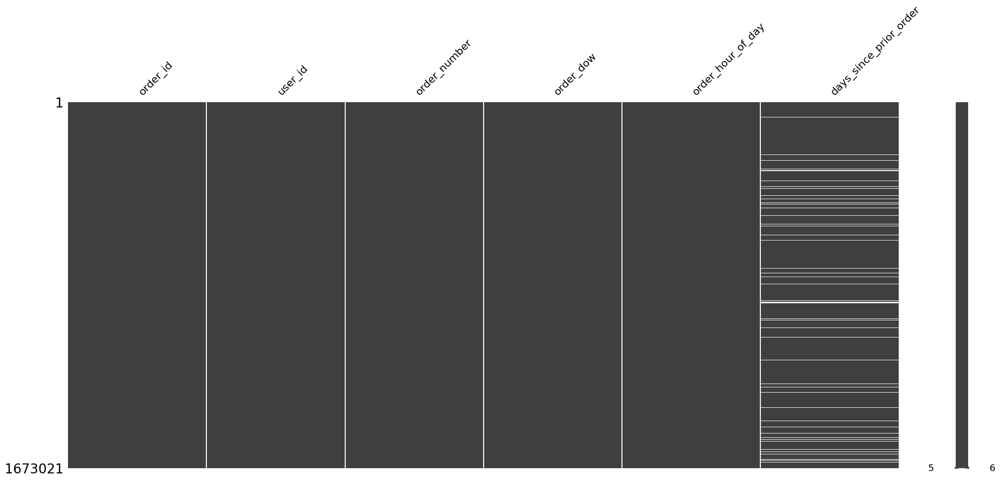

In [38]:
missing_values(df_oders_s)

## Products

In [39]:
df_products

,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13
...,...,...,...,...
49683,49684,"Vodka, Triple Distilled, Twist of Vanilla",124,5
49684,49685,En Croute Roast Hazelnut Cranberry,42,1
49685,49686,Artisan Baguette,112,3
49686,49687,Smartblend Healthy Metabolism Dry Cat Food,41,8


In [40]:
data_overview(df_products)


Informationen über den DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49688 entries, 0 to 49687
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   product_id     49688 non-null  int64 
 1   product_name   49688 non-null  object
 2   aisle_id       49688 non-null  int64 
 3   department_id  49688 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB
None

Statistische Kennzahlen:


,product_id,aisle_id,department_id
count,49688.000000,49688.000000,49688.000000
mean,24844.500000,67.769582,11.728687
std,14343.834425,38.316162,5.850410
min,1.000000,1.000000,1.000000
25%,12422.750000,35.000000,7.000000
50%,24844.500000,69.000000,13.000000
75%,37266.250000,100.000000,17.000000
max,49688.000000,134.000000,21.000000


In [41]:
column_info(df_products)

Spaltennamen:
Index(['product_id', 'product_name', 'aisle_id', 'department_id'], dtype='object')

Datentypen:
product_id        int64
product_name     object
aisle_id          int64
department_id     int64
dtype: object

Eindeutige Werte in 'product_id': 49688
[    1     2     3 ... 49686 49687 49688]

Eindeutige Werte in 'product_name': 49688
['Chocolate Sandwich Cookies' 'All-Seasons Salt'
 'Robust Golden Unsweetened Oolong Tea' ... 'Artisan Baguette'
 'Smartblend Healthy Metabolism Dry Cat Food' 'Fresh Foaming Cleanser']

Eindeutige Werte in 'aisle_id': 134
[ 61 104  94  38   5  11  98 116 120 115  31 119  74  56 103  35  79  63
  40  20  49  47   3  41 127 121  81 123 107 131 106  69 100  64  78  83
  58  66  87  14 105  22 134  23 111 128  50   9  96  92  89  88 130  26
  77  65  12  95  19   7   6  97   2 112  10  51  13  75  70  93  34  62
  21  29  45 118   4 108  37 109  91  24  67 132  25 129  46  16  52  17
  73 122  42  59 126  33   1   8  82 114 124 117  72 110  85  44  80

Fehlende Werte pro Spalte:
product_id       0
product_name     0
aisle_id         0
department_id    0
dtype: int64


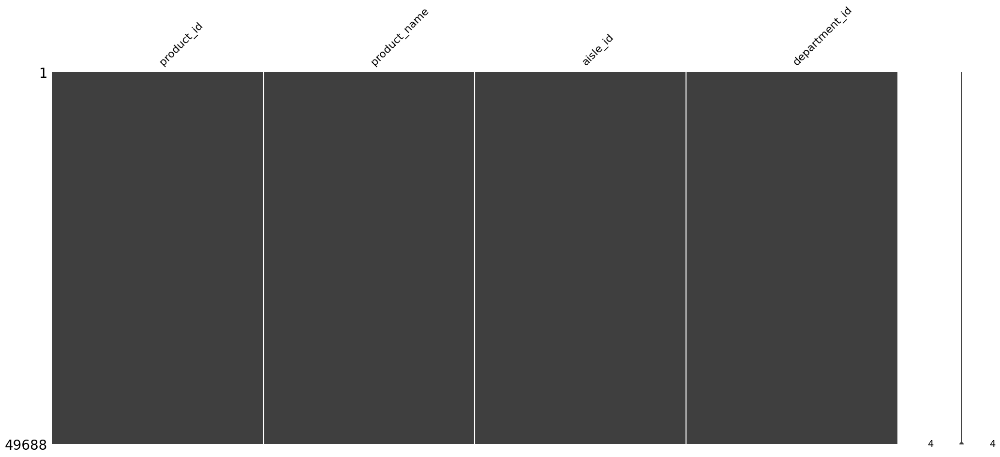

In [42]:
missing_values(df_products)

## tips

In [43]:
df_tips

,tip_id,order_id,tip
0,0,2539329,False
1,1,2398795,False
2,2,473747,False
3,3,2254736,False
4,4,431534,False
...,...,...,...
3346078,3420838,2585586,False
3346079,3420862,943915,True
3346080,3420924,2371631,False
3346081,3420933,1716008,False


In [44]:
data_overview(df_tips)


Informationen über den DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3346083 entries, 0 to 3346082
Data columns (total 3 columns):
 #   Column    Dtype
---  ------    -----
 0   tip_id    int64
 1   order_id  int64
 2   tip       bool 
dtypes: bool(1), int64(2)
memory usage: 54.2 MB
None

Statistische Kennzahlen:


,tip_id,order_id
count,3.346083e+06,3.346083e+06
mean,1.710534e+06,1.710561e+06
std,9.876084e+05,9.875758e+05
min,0.000000e+00,1.000000e+00
25%,8.552335e+05,8.552595e+05
50%,1.710407e+06,1.710552e+06
75%,2.565856e+06,2.565877e+06
max,3.421082e+06,3.421083e+06


In [45]:
column_info(df_tips)

Spaltennamen:
Index(['tip_id', 'order_id', 'tip'], dtype='object')

Datentypen:
tip_id      int64
order_id    int64
tip          bool
dtype: object

Eindeutige Werte in 'tip_id': 3346083
[      0       1       2 ... 3420924 3420933 3421082]

Eindeutige Werte in 'order_id': 3346083
[2539329 2398795  473747 ... 2371631 1716008  272231]

Eindeutige Werte in 'tip': 2
[False  True]


Fehlende Werte pro Spalte:
tip_id      0
order_id    0
tip         0
dtype: int64


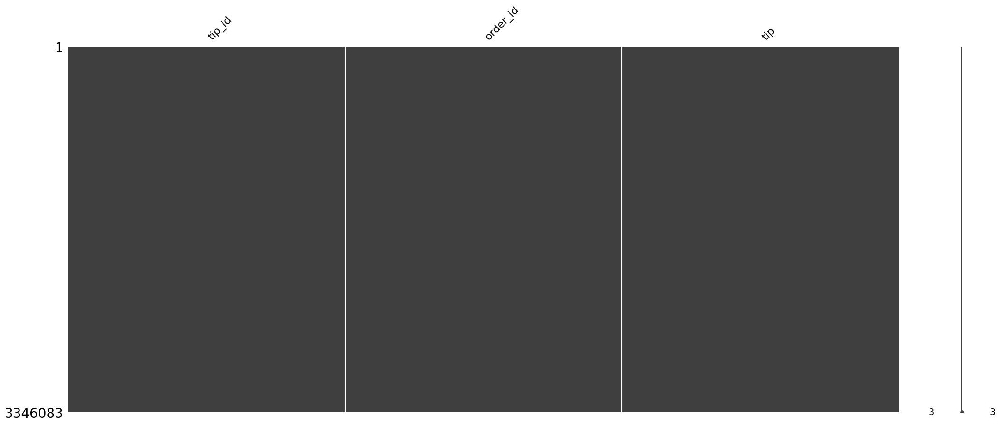

In [46]:
missing_values(df_tips)

### Rename Unnamed Column

In [47]:
# df_tips = df_tips.rename(columns={"Unnamed: 0": "tip_id"})
# df_tips.to_csv("public/tips.csv", index=False)

## Trying to merge everything

In [48]:
# 1. orders mit order_products verbinden
merged_df = pd.merge(df_oders_s, df_order_products, on="order_id", how="left")
# 2. order_product mit products verbinden
merged_df = pd.merge(merged_df, df_products, on="product_id", how="left")
# 3. products mit aisle und departments verbinden
merged_df = pd.merge(merged_df, df_aisles, on="aisle_id", how="left")
merged_df = pd.merge(merged_df, df_departments, on="department_id", how="left")
# 4. order mit tips verbinden
merged_df = pd.merge(merged_df, df_tips, on="order_id", how="left")


In [49]:
merged_df

,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order,product_id,add_to_cart_order,product_name,aisle_id,department_id,aisle,department,tip_id,tip
0,2539329,1,1,2,8,NaN,196,1,Soda,77,7,soft drinks,beverages,0,False
1,2539329,1,1,2,8,NaN,14084,2,Organic Unsweetened Vanilla Almond Milk,91,16,soy lactosefree,dairy eggs,0,False
2,2539329,1,1,2,8,NaN,12427,3,Original Beef Jerky,23,19,popcorn jerky,snacks,0,False
3,2539329,1,1,2,8,NaN,26088,4,Aged White Cheddar Popcorn,23,19,popcorn jerky,snacks,0,False
4,2539329,1,1,2,8,NaN,26405,5,XL Pick-A-Size Paper Towel Rolls,54,17,paper goods,household,0,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16942231,272231,206209,14,6,14,30.0,40603,4,Fabric Softener Sheets,75,17,laundry,household,3421082,False
16942232,272231,206209,14,6,14,30.0,15655,5,Dark Chocolate Mint Snacking Chocolate,45,19,candy chocolate,snacks,3421082,False
16942233,272231,206209,14,6,14,30.0,42606,6,Phish Food Frozen Yogurt,37,1,ice cream ice,frozen,3421082,False
16942234,272231,206209,14,6,14,30.0,37966,7,French Baguette Bread,112,3,bread,bakery,3421082,False


# Testing YData Profiling

In [ ]:
# profile = ProfileReport(merged_df, title="datasets overview", explorative=True)
# profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# profile.to_file("all_in_one_ProfileReport.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# Interpretation | Was will ich von den Daten verstehen?

## Erster Überblick über die Daten

In [50]:
display(df_aisles.head())
display(df_departments.head())
display(df_products.head())
display(df_oders_s.head())
display(df_order_products.head())
display(df_tips.head())

,aisle_id,aisle
0,1,prepared soups salads
1,2,specialty cheeses
2,3,energy granola bars
3,4,instant foods
4,5,marinades meat preparation


,department_id,department
0,1,frozen
1,2,other
2,3,bakery
3,4,produce
4,5,alcohol


,product_id,product_name,aisle_id,department_id
0,1,Chocolate Sandwich Cookies,61,19
1,2,All-Seasons Salt,104,13
2,3,Robust Golden Unsweetened Oolong Tea,94,7
3,4,Smart Ones Classic Favorites Mini Rigatoni Wit...,38,1
4,5,Green Chile Anytime Sauce,5,13


,order_id,user_id,order_number,order_dow,order_hour_of_day,days_since_prior_order
0,2539329,1,1,2,8,NaN
1,2398795,1,2,3,7,15.0
2,473747,1,3,3,12,21.0
3,2254736,1,4,4,7,29.0
4,431534,1,5,4,15,28.0


,order_id,product_id,add_to_cart_order
0,2,33120,1
1,2,28985,2
2,2,9327,3
3,2,45918,4
4,2,30035,5


,tip_id,order_id,tip
0,0,2539329,False
1,1,2398795,False
2,2,473747,False
3,3,2254736,False
4,4,431534,False


In [46]:
display(df_aisles.info())
display(df_departments.info())
display(df_products.info())
display(df_oders_s.info())
display(df_order_products.info())
display(df_tips.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134 entries, 0 to 133
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   aisle_id  134 non-null    int64 
 1   aisle     134 non-null    object
dtypes: int64(1), object(1)
memory usage: 2.2+ KB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   department_id  21 non-null     int64 
 1   department     21 non-null     object
dtypes: int64(1), object(1)
memory usage: 468.0+ bytes


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49688 entries, 0 to 49687
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   product_id     49688 non-null  int64 
 1   product_name   49688 non-null  object
 2   aisle_id       49688 non-null  int64 
 3   department_id  49688 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1673021 entries, 0 to 1673020
Data columns (total 6 columns):
 #   Column                  Non-Null Count    Dtype  
---  ------                  --------------    -----  
 0   order_id                1673021 non-null  int64  
 1   user_id                 1673021 non-null  int64  
 2   order_number            1673021 non-null  int64  
 3   order_dow               1673021 non-null  int64  
 4   order_hour_of_day       1673021 non-null  int64  
 5   days_since_prior_order  1569917 non-null  float64
dtypes: float64(1), int64(5)
memory usage: 76.6 MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16942236 entries, 0 to 16942235
Data columns (total 3 columns):
 #   Column             Dtype
---  ------             -----
 0   order_id           int64
 1   product_id         int64
 2   add_to_cart_order  int64
dtypes: int64(3)
memory usage: 387.8 MB


None

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3346083 entries, 0 to 3346082
Data columns (total 3 columns):
 #   Column    Dtype
---  ------    -----
 0   tip_id    int64
 1   order_id  int64
 2   tip       bool 
dtypes: bool(1), int64(2)
memory usage: 54.2 MB


None

## Daten zusammenführen

In [ ]:
# Zuerst "product" und "department"/"aisle" zusammenfügen, um Productdetails zu erhalten
product_details_df = df_products.merge(df_departments, on="department_id").merge(df_aisles, on="aisle_id")

In [18]:
product_details_df.to_csv("product_details.csv",index=False)

In [19]:
# Füge order_and_product mit product_details zusammen
order_product_details_df =df_order_products.merge(product_details_df, on="product_id")

In [25]:
order_product_details_df.to_csv("order_product_details.csv", index=False)

In [26]:
# Füge Bestellinformation hinzu
order_product_df = order_product_details_df.merge(df_oders_s, on="order_id")

In [28]:
order_product_df.to_csv("full_order_product.csv", index=False)

In [29]:
full_df = order_product_df.merge(df_tips, on="order_id", how="left")

In [45]:
full_df.to_csv("full_data.csv", index=False)

## Beispielanalysen | Testanalysen

In [51]:
# Häufigste Produkte
most_common_products = full_df["product_name"].value_counts().head(10)

In [52]:
# Durchschnittliche Anzahl an Tagen zwischen Bestellungen
avg_days_between_orders = full_df["days_since_prior_order"].mean()

In [53]:
# Verteilung der Bestellungen nach Wochentag und Uhrzeit
order_by_dow_hour = full_df.groupby(["order_dow", "order_hour_of_day"]).size().unstack(fill_value=0)

In [54]:
print("Die 10 meistgekauften Produkte:\n", most_common_products, "\n")
print("Durchschnittliche Tage zwischen Bestellungen:", avg_days_between_orders, "\n")
print("Bestellungen nach Wochentag und Uhrzeit:\n")
display(order_by_dow_hour)

Die 10 meistgekauften Produkte:
 product_name
Banana                    244850
Bag of Organic Bananas    197298
Organic Strawberries      138445
Organic Baby Spinach      126674
Organic Hass Avocado      111509
Organic Avocado            91565
Large Lemon                80748
Strawberries               74606
Limes                      74107
Organic Raspberries        71330
Name: count, dtype: int64 

Durchschnittliche Tage zwischen Bestellungen: 11.343334674465986 

Bestellungen nach Wochentag und Uhrzeit:



order_hour_of_day,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
order_dow,,,,,,,,,,,,,,,,,,,,,
0,20495,12040,6854,4800,4395,6391,19359,70456,161615,230327,...,298704,292245,265044,208607,149830,114896,97609,80861,64956,37407
1,19550,9706,5295,3783,3682,7309,27686,85774,173567,260052,...,235121,229553,216834,173630,133080,102563,78664,61149,48632,29591
2,16058,7963,4566,3804,3703,6850,21591,63541,115053,168501,...,174648,173143,170310,144664,117562,88379,68886,53353,41858,27807
3,14521,7344,4724,2846,3876,5970,21439,58820,103988,142716,...,158279,160400,160379,134610,109381,84626,63308,53568,43866,25360
4,13303,7106,4199,3107,3611,6500,20464,59641,101469,138697,...,156588,155912,156423,131816,108209,87664,68650,58493,46090,28548
5,15633,8585,5171,4709,4857,7828,24461,68297,116415,164943,...,183705,177317,171080,141801,111801,86107,65423,53350,41928,28313
6,16717,10517,5795,4517,4008,5626,16987,60739,127084,166146,...,207827,198877,188917,153641,120489,88641,69149,58533,47628,33405
